In [1]:
import os
import pickle
from itertools import combinations
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams, cycler
from matplotlib.cm import ScalarMappable
import seaborn as sns
import tensorflow as tf
from scipy.stats import pearsonr, gaussian_kde, ecdf
from sklearn.decomposition import PCA
import sys
sys.path.append(os.path.join('c:\\', *os.getcwd().split('\\')[1:-1]))
from sgcc11 import *

In [2]:
plt.rcParams['figure.dpi'] = 300
fontsize = 8
linewidth = 0.5

In [3]:
X = tf.convert_to_tensor(np.arange(0.02,0.34,0.02), dtype = tf.float32)

In [4]:
## load the data
ringach_resp_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'project_datafiles', 'ringach_resp.pkl')
ringach_resp = pd.read_pickle(ringach_resp_file)
Y_true = ringach_resp.mean((0,2)).transpose(1,0,2)

In [5]:
# set the parameter bounds
param_bounds = {
    "fts": [-200, 200],
    "t": [40, 150],
    "ampc": [0.01, 0.1],
    'ampm': [0,3],
    "ampg": [0.1, 4],
    "ampw": [0.01,0.1],
    "d": [10, 40],
    "inh_d": [0, 40],
    "inh_w": [0, 3],
}

In [6]:
model = SGCCircuit(param_bounds, T = 500)

In [7]:
optimized_model_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'project_datafiles', 'joint_exp_fit.pkl')
with open(optimized_model_file, 'rb') as f:
    model_state = pickle.load(f)

In [8]:
model.load_saved_parameters(model_state['final_epoch_params'])

In [9]:
R = model.predict(X)

In [10]:
R.shape

TensorShape([25, 64, 16, 500])

In [11]:
param_history = model_state['param_history']

In [12]:
loss_decay = model_state['loss_decay']
last_epoch = loss_decay[-1]
best = np.where(last_epoch == last_epoch.min())[0][0]
print(f"Index of best parameters: {best}, loss = {last_epoch[best]}")

Index of best parameters: 12, loss = 0.0013113021850585938


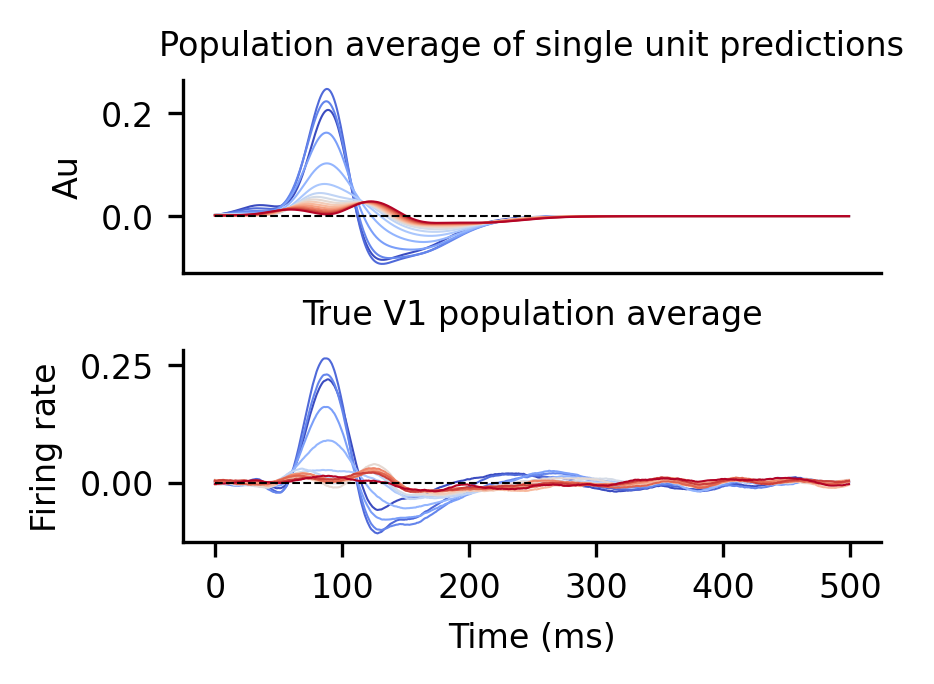

In [13]:
# neurons x SF x time steps

cmap = plt.get_cmap('coolwarm') 
rcParams['axes.prop_cycle'] = cycler(color=cmap(np.linspace(0, 1, 16)))
fig, ax = plt.subplots(2, figsize = (3,2))


ax[0].plot(R[best].numpy().mean(0).T, linewidth = linewidth)
ax[0].set_title("Population average of single unit predictions", fontsize = fontsize)
ax[0].set_xticks([])

ax[1].plot(Y_true.mean(0).T, linewidth = linewidth)
ax[1].set_title('True V1 population average', fontsize = fontsize)
for i in range(2):
    ax[i].plot(np.zeros(250), '--', color = 'black', linewidth = linewidth)
    ax[i].tick_params(labelsize = fontsize)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)

ax[0].set_ylabel("Au", fontsize = fontsize)
ax[1].set_ylabel("Firing rate", fontsize = fontsize)

ax[1].set_xlabel("Time (ms)", fontsize = fontsize)
fig.subplots_adjust(hspace=0.4)


C:\Users\Sturdy\AppData\Local\Temp\ipykernel_13308\338899846.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(2, figsize = (3,2))


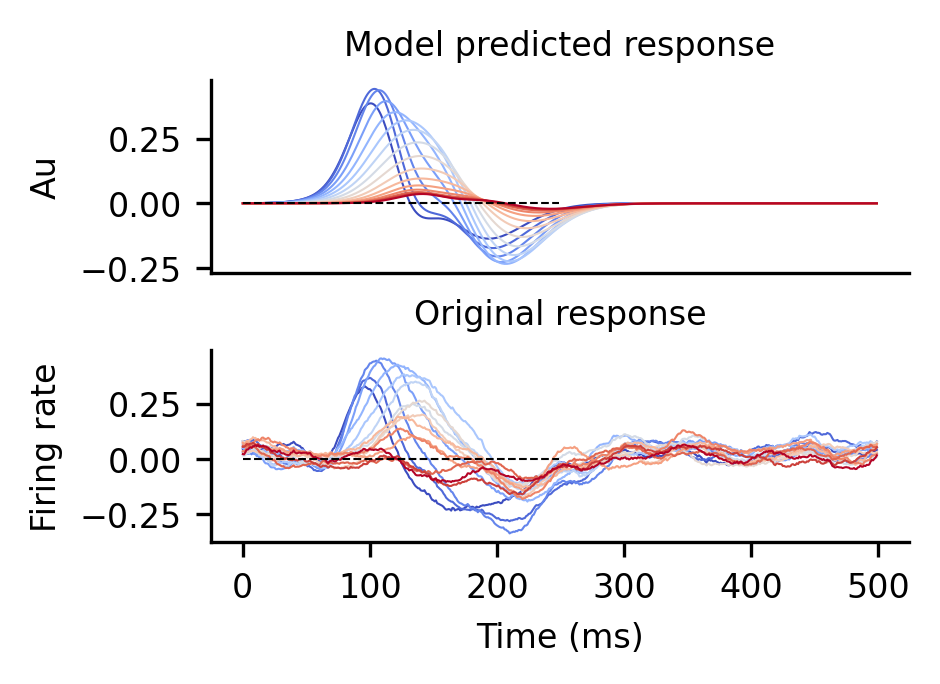

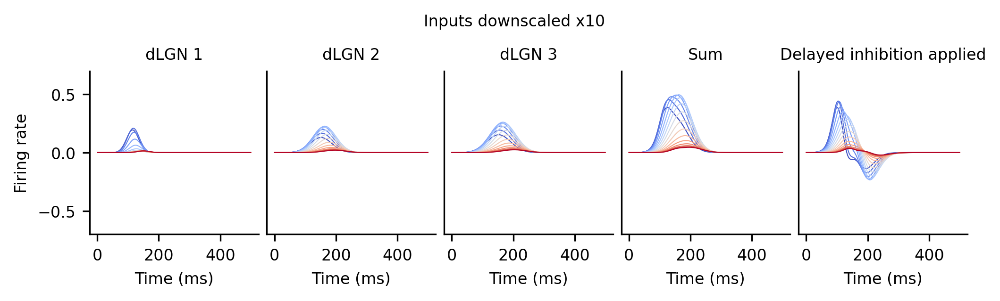

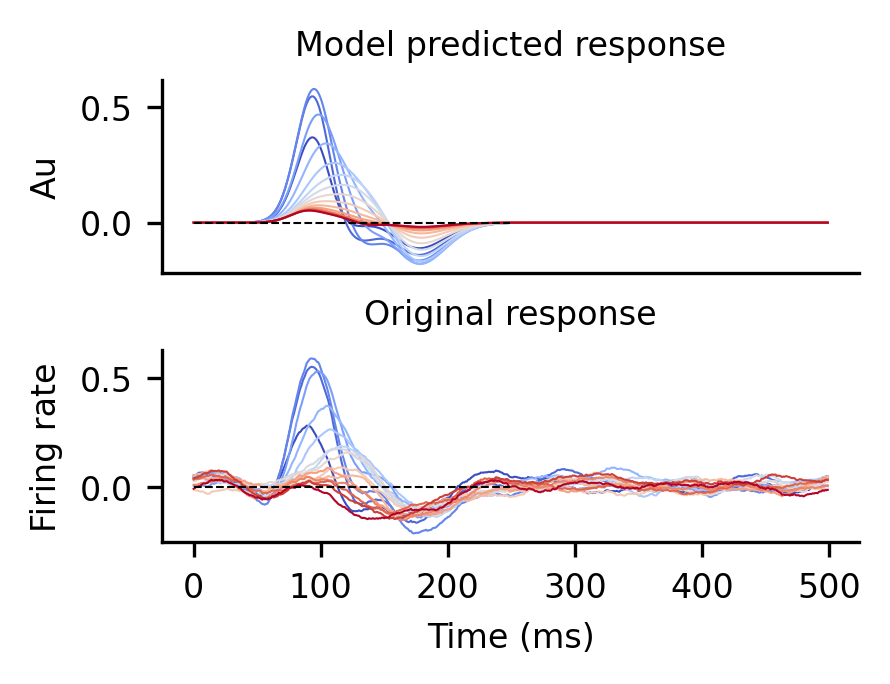

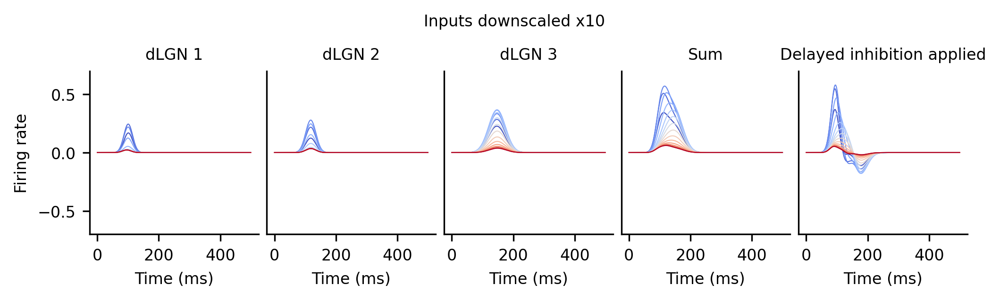

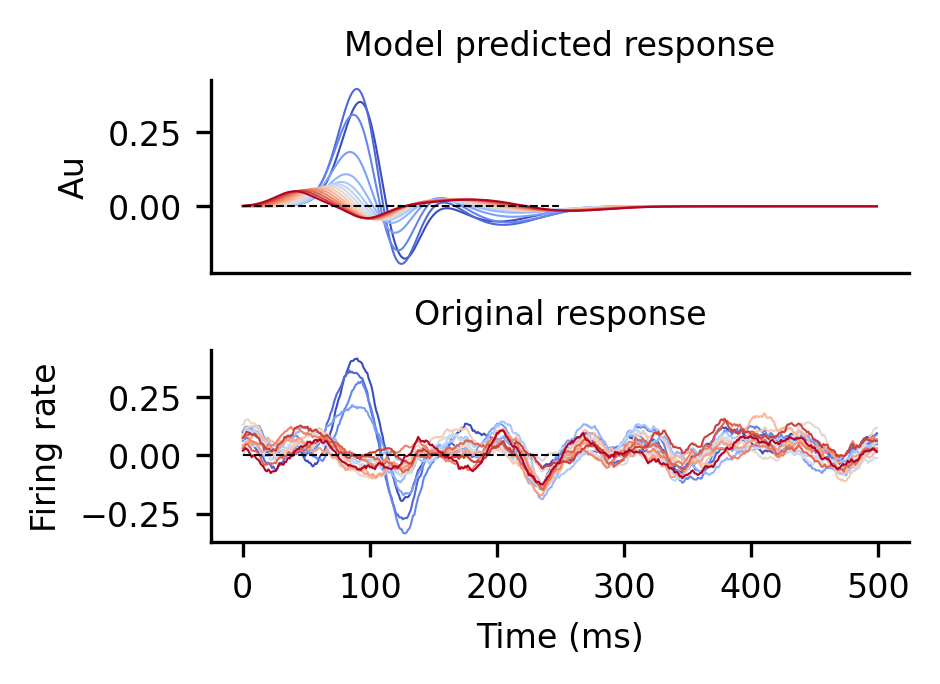

...

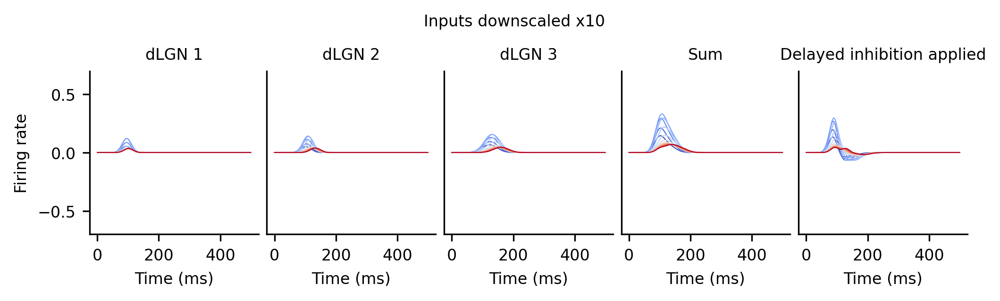

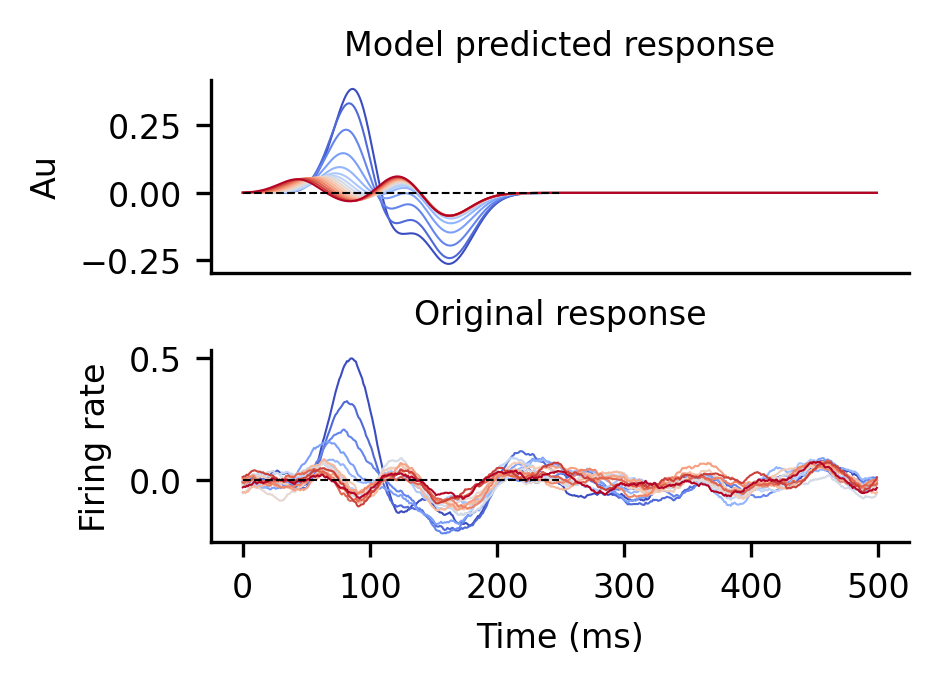

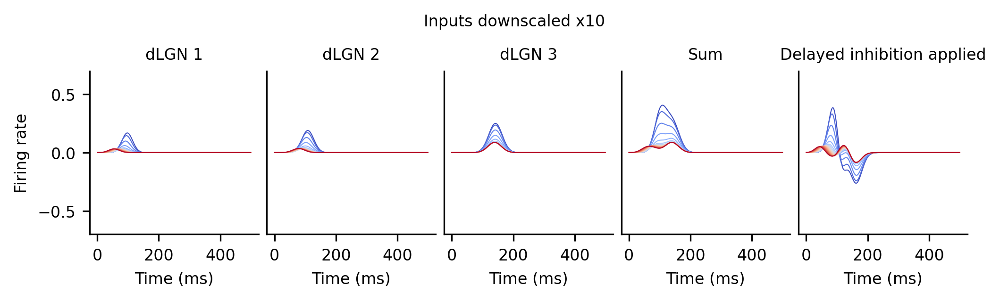

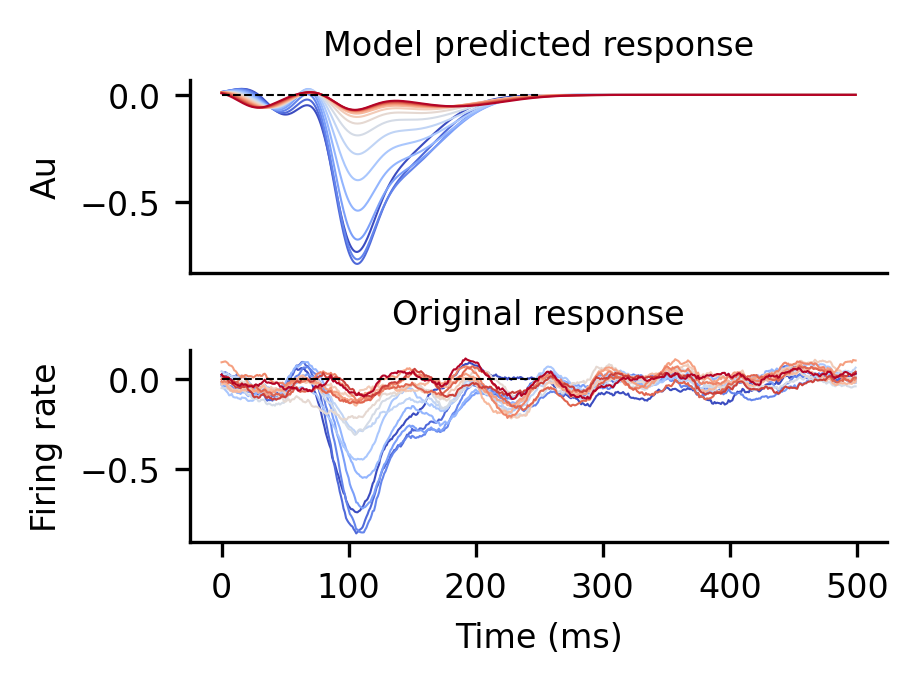

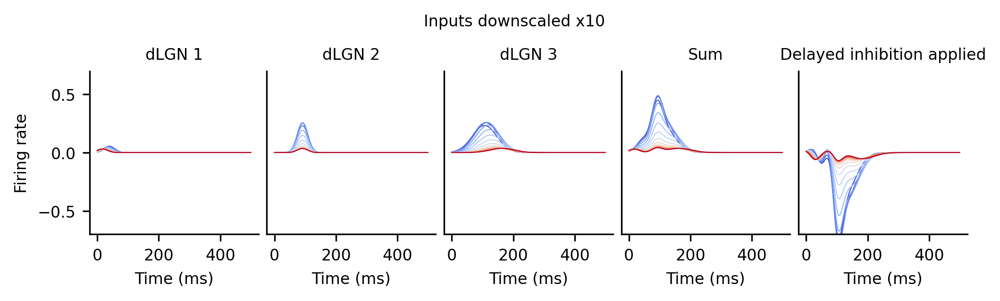

In [14]:
# neurons x SF x time steps

cmap = plt.get_cmap('coolwarm') 
rcParams['axes.prop_cycle'] = cycler(color=cmap(np.linspace(0, 1, 16)))

#17
#52
n = 24
for n in range(0, 64):
    fig, ax = plt.subplots(2, figsize = (3,2))
    
    ax[0].plot(R[best].numpy()[n].T, linewidth = linewidth)
    ax[0].set_title("Model predicted response", fontsize = fontsize)
    ax[0].set_xticks([])

    ax[1].plot(Y_true[n].T, linewidth = linewidth)
    ax[1].set_title('Original response', fontsize = fontsize)
    ylabels = ['Au', 'Firing rate']
    for i in range(2):
        ax[i].set_ylabel(ylabels[i], fontsize = fontsize)
        ax[i].plot(np.zeros(250), '--', color = 'black', linewidth = linewidth)
        ax[i].tick_params(labelsize = fontsize)
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['right'].set_visible(False)

    ax[1].set_xlabel("Time (ms)", fontsize = fontsize)
    fig.subplots_adjust(hspace=0.4)

    fig, ax = plt.subplots(1,5, figsize = (8,1.5))

    ax[0].plot(model.dlgn_exc[best][n,0].numpy().T/10, linewidth = linewidth)
    ax[1].plot(model.dlgn_exc[best][n,1].numpy().T/10, linewidth = linewidth)
    ax[2].plot(model.dlgn_exc[best][n,2].numpy().T/10, linewidth = linewidth)
    ax[3].plot(model.v1_exc[best][n].numpy().T/10, linewidth = linewidth)
    ax[4].plot(R[best].numpy()[n].T, linewidth = linewidth)

    for i in range(5):
        if i>0:
            ax[i].set_yticks([])
        ax[i].set_ylim(-0.7,0.7)
        ax[i].set_xlabel("Time (ms)", fontsize = fontsize)
        ax[i].tick_params(labelsize = fontsize)
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['right'].set_visible(False)

    fig.subplots_adjust(wspace=0.05)
    ax[0].set_ylabel("Firing rate", fontsize = fontsize)

    ax[0].set_title("dLGN 1", fontsize = fontsize)
    ax[1].set_title("dLGN 2", fontsize = fontsize)
    ax[2].set_title("dLGN 3", fontsize = fontsize)
    ax[3].set_title("Sum", fontsize = fontsize)
    ax[4].set_title("Delayed inhibition applied", fontsize = fontsize)
    plt.suptitle("Inputs downscaled x10", fontsize = fontsize, y = 1.15)